# Week 11 - Introduction to Modeling, part 2

## <font color='plum'> ANSWERS IN THIS COLOR

# 1. Lesson - No lesson this week

# Imports

In [100]:
import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt 
import kagglehub 
import time
from sklearn.experimental import enable_halving_search_cv  # Needed to enable

from sklearn.model_selection import (
    train_test_split, 
    cross_val_score, 
    RepeatedStratifiedKFold, 
    GridSearchCV, 
    HalvingGridSearchCV,
    RandomizedSearchCV, 
    RepeatedKFold, 
    cross_val_predict, 
    cross_validate, 
    StratifiedKFold, 
    KFold
)

# # explicitly require this experimental feature
# from sklearn.experimental import enable_halving_search_cv # noqa
# # now you can import normally from model_selection
# from sklearn.model_selection import HalvingGridSearchCV

from sklearn.metrics import (
    r2_score, 
    mean_squared_error, 
    root_mean_squared_error,
    accuracy_score, 
    precision_score, 
    recall_score, 
    f1_score, 
    roc_auc_score, 
    average_precision_score, 
    make_scorer, 
    classification_report, 
    confusion_matrix, 
    roc_curve, 
    auc,
    precision_recall_curve,
    ConfusionMatrixDisplay
)
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_regression
from datetime         import datetime, timedelta
from tqdm             import tqdm
from typing import Any, Dict, List, Union, Tuple
from sklearn.base import BaseEstimator
from collections import Counter
from scipy.stats import randint
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder


%matplotlib inline

from kagglehub              import KaggleDatasetAdapter

sns.set_theme(font_scale=0.8) 
# plt.rcParams['figure.figsize'] = (8, 4)
plt.rcParams['axes.titlesize']  = 10
plt.rcParams['axes.labelsize']  = 8
plt.rcParams['lines.linewidth'] = 0.5
# plt.rcParams['lines.markersize'] = 3
plt.rcParams['axes.edgecolor']  = 'gray'
plt.rcParams['xtick.color']     = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['xtick.color'] = 'gray'
plt.rcParams['ytick.color'] = 'gray'
plt.rcParams['ytick.labelsize'] = 8
plt.rcParams['xtick.labelsize'] = 8

# Utility Functions

In [45]:
def format_hms(seconds):
    return time.strftime("%H:%M:%S", time.gmtime(seconds))

In [46]:
# globals
random_state    = 42
test_size       = 0.2
n_jobs          = -1
font_size       = 8

In [47]:
def format_hms(seconds):
    return time.strftime("%H:%M:%S", time.gmtime(seconds))

#### reorder_columns

In [48]:
def reorder_columns(df: pd.DataFrame, col_names: list) -> pd.DataFrame:
    missing_columns = set(col_names) - set(df.columns)
    # if missing_columns:
    #     raise ValueError(f"Missing columns: {missing_columns}")
    
    for col in missing_columns:
        df[col] = np.nan

    df = df[col_names]
    return df

#### null counts

In [49]:
def show_null_counts_features(df: pd.DataFrame) -> pd.DataFrame:
    """
        Identifies and summarizes columns with missing values in given dataframe .

        Steps performed:
            1. Count Null Values: Calculates the total number of null values in each column.
            2. Calculate Null Percentage: Computes the percentage of null values for each column, rounded to two decimal places.
            3. Determine Feature Types: Identifies whether each column is numeric or categorical based on its data type.
            4. Filter and Sort Columns: Filters out columns without missing values and sorts the remaining columns in descending order of their null percentage.
            5. Display Summary: Prints the total number of samples in the dataset. If there are no null values, it informs the user. Otherwise, it prints a table summarizing the columns with missing values, including the feature name, number of null values, null percentage, and feature type.

        Parameters:
            df (pd.DataFrame): The DataFrame to analyze.

        Returns:
            pd.DataFrame: A DataFrame containing the columns with missing values, along with their null counts, null percentages, and feature types.
    """
    # Count the nulls and calculate the %
    count_nulls = df.isnull().sum()
    df_nulls = (df.isnull().mean() * 100).round(2)
    
    # Determine if the column is numeric or non-numeric
    feature_types = df.dtypes.apply(lambda x: 'Numeric' if np.issubdtype(x, np.number) else 'Categorical')
    
    # Filter out the columns with missing values and sort them in descending order
    missing_data = pd.DataFrame({
        'Feature': count_nulls[count_nulls > 0].index,
        '# Null Values': count_nulls[count_nulls > 0].values, 
        'Null %': df_nulls[df_nulls > 0].values,
        'Type': feature_types[count_nulls > 0].values
    }).sort_values(by='Null %', ascending=False)
    
    print(f'The dataset contains {len(df)} samples.\n')

    if (len(missing_data) == 0):
        print("There are no null values in the dataset!")
    else:
        # Print null value stats
        print('Feature Name    # Nulls      Null %    Type')
        print('------------    -------      ------    ----')
        for index, row in missing_data.iterrows():
            print(f"{row['Feature']:<15} {row['# Null Values']:<12} {row['Null %']:,.2f}%   {row['Type']}")

    return missing_data

#### plot_roc_auc_curve

In [50]:

def plot_roc_auc_curve(classifier, X_test, y_test, title='ROC AUC Curve', ax=None):
    y_proba = classifier.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_proba)
    roc_auc = auc(fpr, tpr)
    if ax is None:
        fig, ax = plt.subplots()
    ax.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (AUC = {roc_auc:.2f})')
    ax.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('False Positive Rate')
    ax.set_ylabel('True Positive Rate')
    ax.set_title(title)
    ax.legend(loc="lower right")
    plt.tight_layout()
    return ax



#### plot_precision_recall_curve

In [51]:


def plot_precision_recall_curve(classifier, X_test, y_test, title='Precision-Recall Curve', ax=None):
    # Get predicted probabilities for the positive class
    y_proba = classifier.predict_proba(X_test)[:, 1]
    
    # Compute precision-recall pairs and average precision score
    precision, recall, _ = precision_recall_curve(y_test, y_proba)
    avg_precision = average_precision_score(y_test, y_proba)
    
    # Create plot if no axis is provided
    if ax is None:
        fig, ax = plt.subplots()
    
    # Plot the precision-recall curve
    ax.plot(recall, precision, color='blue', lw=2, label=f'PR curve (AP = {avg_precision:.2f})')
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.set_xlabel('Recall')
    ax.set_ylabel('Precision')
    ax.set_title(title)
    ax.legend(loc="lower left")
    plt.tight_layout()
    
    return ax


#### plot_confusion_matrix

In [52]:

def plot_confusion_matrix(y_true, y_pred, model_name, labels, ax = None):
    font_size = 10
    plt.rcParams.update({"font.size": font_size})
    cm = confusion_matrix(y_true, y_pred)

    if ax is None:
        fig, ax = plt.subplots(figsize=(5, 3))

    sns.heatmap(cm, annot=True, fmt="d", cmap="viridis", ax=ax,
                xticklabels=labels, yticklabels=labels)

    # Add TP, TN, FP, FN labels
    height, width = cm.shape
    label_matrix = [["TN", "FP"], ["FN", "TP"]]
    for i in range(height):
        for j in range(width):
            ax.text(j + 0.5, i + 0.7, f"\n{label_matrix[i][j]}", 
                    ha='center', va='center', color='white', fontsize=8, fontweight='bold')

    ax.set_title(f"Confusion Matrix - {model_name}\n {labels}")
    ax.set_xlabel("Predicted", fontsize=font_size)
    ax.set_ylabel("True", fontsize=font_size)
    plt.tight_layout()
    return ax




#### plot_feature_importance

In [53]:

def plot_feature_importance(search, X, title="Feature Importance", color="midnightblue", ax=None):
    """
    Plots a horizontal bar chart of feature importances from the best estimator in a search object,
    sorted in descending order (most important features at the top).

        Parameters:
            - search: A fitted GridSearchCV or RandomizedSearchCV object with a tree-based estimator.
            - X: pandas DataFrame of features used to train the model.
            - title: str, title of the plot.
            - color: str, color of the bars.
            - ax: matplotlib Axes object, optional. If None, a new figure and axes will be created.
    """
    # Get  best model from the search object
    best_model = search.best_estimator_

    # Check if  model has feature_importances_ attribute
    if not hasattr(best_model, "feature_importances_"):
        raise AttributeError("The best estimator does not have 'feature_importances_' attribute.")

    # Extract and sort feature importances
    importances = best_model.feature_importances_
    sorted_indices = np.argsort(importances)[::-1]
    sorted_features = X.columns[sorted_indices]
    sorted_importances = importances[sorted_indices]

    # Create plot if no Axes object is provided
    if ax is None:
        fig, ax = plt.subplots(figsize=(6, 4))

    ax.barh(sorted_features, sorted_importances, color=color)
    ax.invert_yaxis()  # Most important features at the top
    ax.set_xlabel("Importance")
    ax.set_title(title)

    plt.tight_layout()
    plt.show()


#### plot_metrics

In [54]:
def plot_metrics(param, 
                 parameter_list, 
                 cv_accuracies, 
                 train_accuracies, 
                 test_accuracies, 
                 std_cvs, 
                 best_index, 
                 model_name
                 ):
    """Plots the accuracy and standard deviation metrics."""
    plt.rcParams.update({"font.size": font_size})
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = (8, 5), sharex=True)
    
    # Use only as many parameter values as computed
    partial_param_list = parameter_list[:len(cv_accuracies)]
    
    # Check if our parameter list is Boolean for proper labeling
    is_boolean      = all(isinstance(val, bool) for val in partial_param_list)
    if is_boolean: 
        # Convert booleans to integer indices for plotting
        x_vals      = list(range(len(partial_param_list)))
        x_labels    = [str(val) for val in partial_param_list]
    else:
        x_vals      = partial_param_list
        x_labels    = partial_param_list
    
    metric = 'Accuracy'

    # ----- First plot: Accuracy ----------------------------------------------------------
    ax1.set_title(f"{model_name} | {metric} vs {param}")
    
    ax1.plot(x_vals, cv_accuracies, marker = '.', label = f"CV {metric}", color = 'midnightblue')
    ax1.plot(x_vals, train_accuracies, marker = '.', label = f"Train {metric}", color = 'green')
    ax1.plot(x_vals, test_accuracies, marker = '.',  label = f"Test {metric}", color = 'orange')
    ax1.scatter([x_vals[best_index]], [cv_accuracies[best_index]], marker='x', s = 100, label = f"Best CV {metric}", color = 'red')
    
    ax1.set_ylabel(metric)
    ax1.legend()
    ax1.grid()
    
    # ----- Second plot: CV Standard Deviation ----------------------------------------------------------
    ax2.set_title(f"{model_name} | CV Standard Deviation vs {param}")
    ax2.plot(x_vals, std_cvs, marker='.', label = f"CV {metric} Std", color = 'midnightblue')
    ax2.set_xlabel(param)
    ax2.set_ylabel("Standard Deviation")
    ax2.legend()
    ax2.grid(alpha = 0.5)
    
    # If using boolean x-values, set custom ticks
    if is_boolean:
        ax2.set_xticks(x_vals)
        ax2.set_xticklabels(x_labels)
    
    plt.tight_layout()
    plt.show()


#### check_early_stopping

In [55]:
def check_early_stopping(mean_cv_accuracy, best_accuracy, no_improve_count, delta, n_iter_no_change):
    """Checks if early stopping criteria are met."""
    if mean_cv_accuracy > best_accuracy + delta:
        best_accuracy = mean_cv_accuracy
        no_improve_count = 0
    else:
        no_improve_count += 1
    
    if n_iter_no_change is not None and no_improve_count >= n_iter_no_change:
        print(f"Early stopping: No improvement after {n_iter_no_change} iterations.")
        return True, best_accuracy, no_improve_count
    
    return False, best_accuracy, no_improve_count

#### get_parameter_list

In [56]:
def get_parameter_list(parameter: str,  
                       custom_list: list    = None, 
                       df: pd.DataFrame     = None
                       ):
    
    """
    Returns a list of parameter values based on the given parameter name, using a dictionary.

        Args:
            parameter: name of the parameter.
            custom_list: Optional list of custom values, which will override the values in parameter_dict.
            df: Optional DataFrame, used for calculating total features for 'max_features'.

        Returns:
            A list of parameter values.
    """

    parameter_dict = {
        'n_estimators': list(np.arange(50, 1001, 50)),
        'max_samples': [1.0],
        'max_depth': [None] + list(np.arange(2, 17, 2)),
        'bootstrap': [True, False],
        'learning_rate': list(np.arange(.01, .50, .05)),
        'min_samples_size': list(np.arange(1, 11)),
        'min_samples_leaf': list(np.arange(1, 11))
    }

    if custom_list is not None:
        parameter_dict[parameter] = custom_list

    if parameter == 'max_features':
        if df is None:
            raise ValueError("DataFrame 'df' is required to calculate 'max_features'.")
        if parameter_dict.get('max_features') is not None:
            return parameter_dict['max_features']
        else:
            total_features = df.shape[1]
            return list(range(2, total_features)) # or list(range(18, total_features+1)), or any other range you wish.
    
    elif parameter in parameter_dict:
        return parameter_dict[parameter]
    
    else:
        return []
    

#### get_classification_labels

In [57]:
def get_classification_labels(dictionary): 
    """
    Returns the classification labels from a dictionary of outcomes--assumes the values are strings.
    """
    
    return [v for v in dictionary.items()]

#### run_model

In [58]:
# def run_model(
#     model:          Union[BaseEstimator, type],  # The model or model class
#     show_accuracy:  bool,  # score by Accuracy if Classification task else by MSE
#     X_train:        np.ndarray,  # Training feature set
#     y_train:        np.ndarray,  # Training target set
#     X_test:         np.ndarray,  # Testing feature set
#     y_test:         np.ndarray,  # Testing target set
#     n_repeats:      int     = 10,  # Number of repeats for cross-validation
#     cv_folds:       int     = 5,  # Number of k cross-validation folds
#     n_jobs:         int     = -1,  # Number of jobs to run in parallel
#     exp_factor:     float   = 1,  # Exponent factor for MSE values
#     classification_dict     = None,
#     **model_params: Any  # Additional parameters for the model

# ) -> Tuple[float, float, float, float, int, int]:

#     """
#     Runs a machine learning model with specified parameters and performs cross-validation. If task = Classification, plots a confusion matrix.

#         Parameters:
#             - model: The machine learning model or model class to be used.
#             - show_accuracy: Boolean flag to score by accuracy if classification task else by MSE.
#             - X_train: Training feature set as a NumPy array.
#             - y_train: Training target set as a NumPy array.
#             - X_test: Testing feature set as a NumPy array.
#             - y_test: Testing target set as a NumPy array.
#             - n_repeats: Number of repeats for cross-validation (default is 10).
#             - cv_folds: Number of k cross-validation folds (default is 5).
#             - n_jobs: Number of jobs to run in parallel (default is -1).
#             - exp_factor: Exponent factor for MSE values (default is 1).
#             - classification_dict: Dictionary for classification labels (default is None).
#             - **model_params: Additional parameters for the model.

#         Returns:
#             - Tuple containing mean and standard deviation of cross-validation scores, training and testing scores,
#               number of iterations, and number of cross-validation folds.
#     """

#     # Remove extra key used to store error metric, if it was added to the parameter dictionary
#     if 'accuracy_found' in model_params:
#         model_params = model_params.copy()
#         model_params.pop('accuracy_found', None)

#     # Instantiate the model if a class is provided
#     if isinstance(model, type):
#         model = model(**model_params)
#     else:
#         model.set_params(**model_params) # Setting params for an instance

#     decimals = 4 # Number of decimal places to round to
#     # Use RepeatedStratifiedKFold for classification to preserve class distribution
#     # Perform 5-fold cross-validation using accuracy as the scoring metric

#     if show_accuracy:
#         cv_scores = cross_val_score(model,
#                                     X_train,
#                                     y_train,
#                                     scoring = 'accuracy',
#                                     n_jobs  = n_jobs,
#                                     cv      = RepeatedStratifiedKFold(n_splits      = cv_folds,
#                                                                       n_repeats     = n_repeats,
#                                                                       random_state  = 42  # Use a fixed random_state
#                                                                     ),
#                     )

#         mean_cv_accuracy = round(np.mean(cv_scores), decimals)
#         std_cv_accuracy  = round(np.std(cv_scores), decimals)

#         # Fit the model on the full training set
#         model.fit(X_train, y_train)

#         iterations  = n_repeats
#         cv_folds    = cv_folds

#         # Compute training and testing accuracy
#         train_preds     = model.predict(X_train)
#         train_accuracy  = round(accuracy_score(y_train, train_preds), decimals)
#         test_preds      = model.predict(X_test)
#         test_accuracy   = round(accuracy_score(y_test, test_preds), decimals)


#         return mean_cv_accuracy, std_cv_accuracy, train_accuracy, test_accuracy, iterations, cv_folds

#     else:
#         neg_mse_scores = cross_val_score(model,
#                                      X_train,
#                                      y_train,
#                                      scoring    = 'neg_mean_squared_error',
#                                      cv         = RepeatedKFold(n_splits = 5, n_repeats = n_repeats, random_state = 42),
#                                      n_jobs     = n_jobs
#                                      )

#         mse_scores  = (-neg_mse_scores) ** exp_factor
#         mean_cv_mse = round(np.mean(mse_scores),3)
#         std_cv_mse  = round(np.std(mse_scores), 3)

#         # Fit the model on the full training set
#         model.fit(X_train, y_train)

#         # Compute training MSE and testing MSE
#         train_preds = model.predict(X_train)
#         train_mse   = round(mean_squared_error(y_train, train_preds) ** exp_factor, 3)
#         test_preds  = model.predict(X_test)
#         test_mse    = round(mean_squared_error(y_test, test_preds) ** exp_factor, 3)

#         return mean_cv_mse, std_cv_mse, train_mse, test_mse, iterations, cv_folds


#### sweep_parameter

In [59]:
def sweep_parameter(model,
                    Parameters:     dict,
                    param:          str,
                    parameter_list: list,
                    X_train:        np.ndarray,
                    y_train:        np.ndarray,
                    X_test:         np.ndarray,
                    y_test:         np.ndarray,
                    verbose          = True,
                    show_rmse        = False,
                    show_accuracy    = True,
                    n_iter_no_change = None,
                    delta            = 0.001,
                    n_jobs           = -1,
                    n_repeats        = 10,
                    cv_folds         = 5,
                    classification_dict = None
                    ) -> Dict[str, Any]:

    """
        Sweeps a specified parameter of a Classification machine learning model and evaluates performance metrics.

            Arguments:
                - model:            The machine learning model or model class to be used.
                - Parameters:       Dictionary of model parameters.
                - param:            The parameter to sweep.
                - parameter_list:   List of values to test for the specified parameter.
                - X_train:          Training feature set.
                - y_train:          Training target set.
                - X_test:           Testing feature set.
                - y_test:           Testing target set.
                - verbose:          If True, prints detailed output and plots results (default is True).
                - show_rmse:        If True, shows RMSE instead of MSE (default is True).
                - n_iter_no_change: Number of iterations with no improvement to trigger early stopping (default is None).
                - delta:            Minimum change in MSE to qualify as an improvement (default is 0.001).
                - n_jobs:           Number of jobs to run in parallel for cross-validation (default is -1, using all processors).
                - n_repeats:        Number of repeats for cross-validation (default is 10).
                - cv_folds:         Number of k cross-validation folds (default is 5).
                - classification_dict: Dictionary for classification labels (default is None).

            Returns:
                - Parameters: Updated dictionary of model parameters with the best parameter value found and additional information.
    """

    decimals                = 4
    start                   = time.time()
    Parameters              = Parameters.copy()  # Avoid modifying the original dictionary

    print(f"Running {model.__name__} with {param} sweep...\n")

    cv_accuracies, std_cvs, train_accuracies, test_accuracies = [], [], [], []
    no_improve_count        = 0
    best_accuracy           = -np.inf  # since higher accuracy is better
    best_test_preds         = None # To store best predictions for confusion matrix

    # Run over each value in parameter_list
    for p in tqdm(parameter_list, desc = f"Sweeping {param}"):
        Parameters[param]   = p
        P_temp              = Parameters.copy()
        # Remove accuracy_found if present, just in case
        P_temp.pop('accuracy_found', None)

        # run_model should return: mean_cv_accuracy, std_cv_accuracy, train_accuracy, test_accuracy
        mean_cv_accuracy, std_cv_accuracy, train_accuracy, test_accuracy, iterations, cv_folds = run_model(
            model               = model,
            show_accuracy       = show_accuracy,
            X_train             = X_train,
            y_train             = y_train,
            X_test              = X_test,
            y_test              = y_test,
            n_repeats           = n_repeats,
            cv_folds            = cv_folds,
            n_jobs              = n_jobs,
            exp_factor          = 0.5 if show_rmse else 1,
            classification_dict = classification_dict,
            **P_temp
        )
        print(f"{param} = {p}: CV_mean_accuracy = {mean_cv_accuracy:,.{decimals}f}, Train_accuracy = {train_accuracy:,.{decimals}f}, Test_accuracy = {test_accuracy:,.{decimals}f}")

        cv_accuracies.append(mean_cv_accuracy)
        std_cvs.append(std_cv_accuracy)
        train_accuracies.append(train_accuracy)
        test_accuracies.append(test_accuracy)

       # Early-stopping logic: maximize accuracy
        if mean_cv_accuracy > best_accuracy + delta:
            best_accuracy       = mean_cv_accuracy
            no_improve_count    = 0

            # Get test predictions for best model
            model_instance      = model(**P_temp) # Instantiate with current best params
            model_instance.fit(X_train, y_train)  # Fit the model with the best parameters
            best_test_preds     = model_instance.predict(X_test)
        else:
            no_improve_count    += 1

        if n_iter_no_change is not None and no_improve_count >= n_iter_no_change:
            print(f"Early stopping: No improvement after {n_iter_no_change} iterations.")
            break

    # Identify best parameter
    max_cv_accuracy                 = max(cv_accuracies)
    max_index                       = cv_accuracies.index(max_cv_accuracy)
    best_param                      = parameter_list[max_index]
    
    Parameters['Test_Param']        = param
    Parameters[param]               = best_param
    Parameters['Model']             = model.__name__

    Parameters['Best_CV_Accuracy']  = round(max_cv_accuracy, decimals)
    Parameters['Test_Accuracy']     = round(test_accuracies[max_index], decimals)

    Parameters['n_repeats']         = n_repeats
    Parameters['cv_folds']          = cv_folds

    end                             = time.time()
    execution_time                  = format_hms(end - start)
    Parameters['execution_time']    = execution_time
    timestamp                       = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end))
    Parameters['timestamp']         = timestamp

#### GENERATE PLOTS #####
    if verbose:
        plot_metrics(param, parameter_list, cv_accuracies, train_accuracies, test_accuracies, std_cvs, max_index, Parameters['Model'])

        print(f"\nBest {param} found: {best_param}")
        print(f"Best_CV_Accuracy: {max_cv_accuracy:,.{decimals}f}")
        print(f"Test_Accuracy: {round(test_accuracies[max_index], decimals)}")
        
        print("Classification Report:-----------------\n", classification_report(y_test, best_test_preds))
        # Plot CONFUSION MATRIX for best model ############################
        # if show_accuracy and best_test_preds is not None:
        #     fig, ax     = plt.subplots()
            
        #     class_names = get_classification_labels(classification_dict)

        #     plot_confusion_matrix(y_test, best_test_preds, Parameters['Model'], class_names, Parameters['Test_Param'],  ax = ax)
        #     plt.show()

    # Print timestamp and run-time of successful execution
    print(f'Execution time: {execution_time}')
    print("Execute successfully at:", time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end)))

    return Parameters

#### run_GridSearch_RandomizedSearch_CV

In [60]:
# explicitly require this experimental feature
from sklearn.experimental import enable_halving_search_cv # noqa
from sklearn.model_selection import HalvingGridSearchCV

def run_GridSearch_RandomizedSearch_CV(
        ensemble_model,
        parameter_grid: dict,
        X: pd.DataFrame,
        X_train,
        y_train,
        X_test,
        y_test,
        CV_tuning_strategy: int = 0,  # 0=Randomized, 1=HalvingGrid, 2=Grid
        is_classifier: bool = True,
        classification_dict: dict = None,
        iterations: int = 10,
        n_jobs: int = -1,
        verbose: bool = True,
        n_repeats: int = 10,
        cv_folds: int = 5,
        random_state: int = None,
        scoring_metric: str = 'accuracy',
        halving_factor: int = 2
    ) -> tuple:

    if isinstance(ensemble_model, type):
        model = ensemble_model(random_state=random_state)
    else:
        model = ensemble_model

    model_name = model.__class__.__name__

    search_params = {
        'n_jobs':           n_jobs,
        'verbose':          verbose,
        'cv':               cv_folds,
        'scoring':          scoring_metric,
        'return_train_score': True,
        'random_state':     random_state,
        'estimator':        model
    }

    if CV_tuning_strategy == 0:
        search_type = 'RandomizedSearchCV'

        print(f"Using {search_type}...")
        search = RandomizedSearchCV(
            param_distributions = parameter_grid,
            n_iter              = iterations,
            **search_params
        )

    elif CV_tuning_strategy == 1:
        search_type = 'HalvingGridSearchCV'

        print(f"Using {search_type} with halving factor {halving_factor}...")
        search = HalvingGridSearchCV(
            param_grid          = parameter_grid,
            factor              = halving_factor,
            **search_params
        )

    else:
        if CV_tuning_strategy != 2:
            raise ValueError("CV_tuning_strategy must be 0 (Randomized), 1 (HalvingGrid), or 2 (Grid).")
        search_type = 'GridSearchCV'
        print(f"Using {search_type}...")
        search = GridSearchCV(
            param_grid          = parameter_grid,
            **search_params
        )
       

    start   = time.time()
    search.fit(X_train, y_train)
    end     = time.time()

    cv_results_df = pd.DataFrame(search.cv_results_)

    print(f"\nBest Parameters: {search.best_params_}")
    best_score = search.best_score_
    print(f"Best CV Score ({scoring_metric}): {best_score:,.4f}")

    y_pred      = search.best_estimator_.predict(X_test)
    test_score  = accuracy_score(y_test, y_pred)
    print(f"Test Accuracy: {test_score:,.4f}")

    execution_time = format_hms(end - start)
    print(f"Execution Time: {execution_time} seconds")

    timestamp = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end))
    print(f'Completed at: {timestamp}')

    if is_classifier:
        print("\nClassification Report:\n", classification_report(y_test, y_pred, digits=4))

        train_preds     = search.best_estimator_.predict(X_train)
        train_accuracy  = round(accuracy_score(y_train, train_preds), 4)
        print(f"Train Accuracy: {train_accuracy:,.4f}")
        print(f"Test Accuracy: {test_score:,.4f}")

        labels = [v for v in classification_dict.values()] if classification_dict else None
        fig, ax = plt.subplots(2, 2, figsize=(15, 9))
        ax      = ax.flatten()

        plot_roc_auc_curve(search.best_estimator_, X_test, y_test, title=f'{model_name} ROC AUC Curve', ax=ax[0])
        plot_precision_recall_curve(search.best_estimator_, X_test, y_test, title=f'{model_name} Precision-Recall Curve', ax=ax[1])
        plot_confusion_matrix(y_test, y_pred, model_name, labels, ax=ax[2])
        plot_feature_importance(search, X, title=f'{model_name} Feature Importance\n{classification_dict}', color='midnightblue', ax=ax[3])

        plt.tight_layout()
        plt.show()

    best_params_df = pd.DataFrame([search.best_params_])
    best_params_df['Model'] = model_name
    best_params_df['Test_Param'] = search_type
    best_params_df['Best_CV_Score'] = best_score
    best_params_df['Test_Accuracy'] = test_score
    best_params_df['execution_time'] = execution_time
    best_params_df['timestamp'] = timestamp

    return best_params_df, cv_results_df, search


In [61]:

# def run_GridSearch_RandomizedSearch_CV(
#         ensemble_model,
#         parameter_grid: dict,
#         X: pd.DataFrame, #for that stupid feature importance plot
#         X_train,
#         y_train,
#         X_test,
#         y_test,
#         randomized_search       = True,
#         show_accuracy           = True,
#         classification_dict: dict = None,
#         iterations: int           = 10,
#         n_jobs: int               = -1,
#         verbose                   = True,
#         n_repeats: int            = 10,
#         cv_folds: int             = 5,
#         random_state: int         = None,
#         scoring_metric: str       = 'accuracy'
#     ) -> tuple:

#     if isinstance(ensemble_model, type):
#         model = ensemble_model(random_state=random_state)
#     else:
#         model = ensemble_model

#     model_name = model.__class__.__name__
#     use_RandomizedSearchCV = randomized_search

#     if use_RandomizedSearchCV:
#         print("Using RandomizedSearchCV...")
#         search = RandomizedSearchCV(
#             estimator           = model,
#             param_distributions = parameter_grid,
#             n_iter              = iterations,
#             scoring             = scoring_metric,
#             cv                  = cv_folds,
#             n_jobs              = n_jobs,
#             return_train_score  = True,
#             verbose             = verbose
#         )
#     else:
#         print("Using GridSearchCV...")
#         search = GridSearchCV(
#             estimator           = model,
#             param_grid           = parameter_grid,
#             scoring              = scoring_metric,
#             cv                   = cv_folds,
#             n_jobs               = n_jobs,
#             return_train_score   = True,
#             verbose              = verbose
#         )

#     start   = time.time()
#     search.fit(X_train, y_train)
#     end     = time.time()

#     cv_results_df = pd.DataFrame(search.cv_results_)

#     print(f"\nBest Parameters: {search.best_params_}")
    
#     best_score = search.best_score_
#     print(f"Best CV Score ({scoring_metric}): {best_score:,.4f}")

#     y_pred       = search.best_estimator_.predict(X_test)
#     test_score   = accuracy_score(y_test, y_pred)
#     print(f"Test Accuracy: {test_score:,.4f}")

#     execution_time = format_hms(end - start)
#     print(f"Execution Time: {execution_time} seconds")

#     timestamp = time.strftime("%Y-%m-%d %H:%M:%S", time.localtime(end))
#     print(f'Completed at: {timestamp}')

# #### 2 x 2 PLOT ########################################################
#     if show_accuracy:
#         print("\nClassification Report:\n", classification_report(y_test, y_pred, digits=4))

#         train_preds = search.best_estimator_.predict(X_train)
#         train_accuracy = round(accuracy_score(y_train, train_preds), 4)
#         print(f"Train Accuracy: {train_accuracy:,.4f}")
#         print(f"Test Accuracy: {test_score:,.4f}")

#         labels = [v for v in classification_dict.values()] if classification_dict else None
#         fig, ax = plt.subplots(2, 2, figsize=(15, 9))

#         ax = ax.flatten()  # Flatten to 1D array for easy indexing
#         plot_roc_auc_curve(search.best_estimator_, X_test, y_test, title=f'{model_name} ROC AUC Curve', ax=ax[0])
#         plot_precision_recall_curve(search.best_estimator_, X_test, y_test, title=f'{model_name} Precision-Recall Curve', ax=ax[1])
#         plot_confusion_matrix(y_test, y_pred, model_name, labels, ax=ax[2])
#         plot_feature_importance(search, X, title = f'{model_name} Feature Importance\n{classification_dict}', color='midnightblue', ax=ax[3])

#         plt.tight_layout()
#         plt.show()

#     best_params_df = pd.DataFrame([search.best_params_])
#     best_params_df['Model'] = model_name
#     best_params_df['Test_Param'] = 'RandomizedSearchCV' if use_RandomizedSearchCV else 'GridSearchCV'
#     best_params_df['Best_CV_Score'] = best_score
#     best_params_df['Test_Accuracy'] = test_score
#     best_params_df['execution_time'] = execution_time
#     best_params_df['timestamp'] = timestamp

#     return best_params_df, cv_results_df, search 



# 2. Weekly graph question

The book names one of Vonnegut's rules as "keep it simple" and another as "have the guts to cut."  Here is some data from the previous week's lesson.  If you had to cut one of the two plots below, which would it be?  Which seems more interesting or important?  Explain.  (Should "amount of training data used" or "number of estimators" be on the x-axis.)

In [104]:
from sklearn.ensemble import RandomForestRegressor


np.random.seed(0)
num_points = 10000

feature_1a = np.random.random(size = num_points) * 3
feature_2a = np.random.random(size = num_points) * 3
feature_3a = np.random.random(size = num_points) * 3
train_target = (feature_1a - 2 * feature_2a) * feature_3a + np.random.normal(size = num_points)

feature_1b = np.random.random(size = num_points) * 3
feature_2b = np.random.random(size = num_points) * 3
feature_3b = np.random.random(size = num_points) * 3
test_target = (feature_1b - 2 * feature_2b) * feature_3b + np.random.normal(size = num_points)

train_df = pd.DataFrame({"f1": feature_1a, "f2": feature_2a, "f3": feature_3a})
test_df = pd.DataFrame({"f1": feature_1b, "f2": feature_2b, "f3": feature_3b})

rf = RandomForestRegressor()
rf.fit(train_df.values, train_target)

RandomForestRegressor()

Text(0, 0.5, 'Loss function')

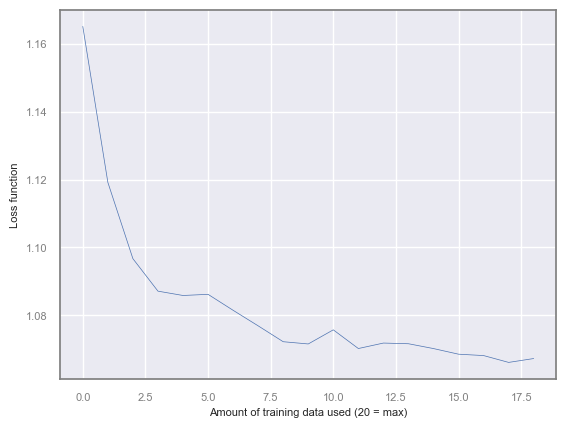

In [105]:
rmse_lst = list()

# rf = RandomForestRegressor()

for x in range(round(num_points / 20), num_points, round(num_points / 20)):
    rf.fit(train_df.values[0:x,:], train_target[0:x])
    rmse = root_mean_squared_error(rf.predict(test_df.values), test_target)
    rmse_lst.append(rmse)

plt.plot(rmse_lst)
plt.xlabel("Amount of training data used (20 = max)")
plt.ylabel("Loss function")


Text(0, 0.5, 'Loss function')

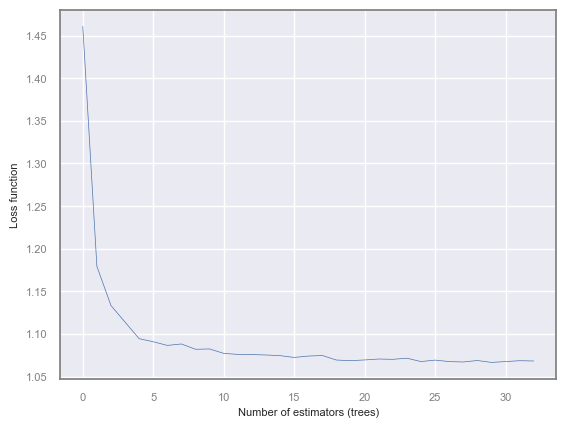

In [106]:
num_trees_lst = list()
for n_estimators in range(1, 100, 3):
    rf = RandomForestRegressor(n_estimators = n_estimators)
    rf.fit(train_df.values, train_target)
    rmse = root_mean_squared_error(rf.predict(test_df.values), test_target)
    num_trees_lst.append(rmse)


plt.plot(num_trees_lst)
plt.xlabel("Number of estimators (trees)")
plt.ylabel("Loss function")

<font color='plum'> 

If I had to choose one, I would keep the **'RMSE vs. Number of Estimators (trees)'** plot. 


1. The 'RMSE vs. Number of Estimators' plot directly addresses hyperparameter tuning, specifically, determining the optimal number of trees in a random forest. Adding too few trees can lead to underfitting, while adding too many can increase training time without significant gains in accuracy, and potentially lead to overfitting  This plot helps identify the "sweet spot" where the model performs best without unnecessary complexity.

2. If the RMSE is still decreasing significantly with more estimators, it suggests that increasing the number of trees could lead to a better model. If the curve flattens out, it indicates that further increases in estimators will likely not yield much benefit.

3. In many real-world scenarios, the amount of available training data is fixed. So, while it's good to know if more data would help, it might not be available. The 'Number of estimators' plot, however, focuses on how to best utilize the data we already have.

# 3. Working on your datasets

This week, you will do the same types of exercises as last week, but you should use your chosen datasets that someone in your class found last semester. (They likely will not be the particular datasets that you found yourself.)

Here are some types of analysis you can do:

* Implement a random forest model.
* Perform cross-validation.
* Tune hyperparameters.
* Evaluate a performance metric.

If you like, you can try other types of models, too (beyond linear regression and random forest) although you will have many opportunities to do that next semester.

## <font color='plum'> 3.a. Diabetes Health Indicators Dataset
Over 250,000 responses from a U.S. national health survey with demographic and lifestyle variables (e.g., BMI, activity level, smoking, sleep, general health).

Designed for predicting diabetes status (none, pre-diabetic, diabetic).
https://www.kaggle.com/datasets/alexteboul/diabetes-health-indicators-dataset

### Load & Clean

In [65]:
file_path = "alexteboul/diabetes-health-indicators-dataset"
file_name = "diabetes_binary_5050split_health_indicators_BRFSS2015.csv"

#diabetes_012_health_indicators_BRFSS2015.csv
#diabetes_binary_health_indicators_BRFSS2015.csv

# Load the latest version
df_3a = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)
df_3a.columns = df_3a.columns.str.strip() 
# df_3a.head(n = 10)

### Random Forest Classifier - Diabetes

In [66]:
random_state        = 42
test_size           = 0.2

# rename column 'Sex' to 'Gender' 
df_3a.rename(columns = {'Sex': 'Gender'}, inplace = True)

target_col          = 'Diabetes_binary'
data                = df_3a.drop(columns = [target_col])
X                   = df_3a.drop(columns = [target_col])
y                   = df_3a[target_col]

numeric_cols     = []
categorical_cols = []

for col in df_3a.columns:
    if df_3a[col].nunique() > 2:
        numeric_cols.append(col);
    else:
        categorical_cols.append(col);
    # print(f'{col}: {df_3a[col].unique()},\n{df_3a[col].nunique()} unique values\n')

In [67]:
dict_outcome = {
    0: 'No Diabetes',
    1: 'Pre-/Diabetes'
}

In [68]:
# y.value_counts().plot(kind='bar', title='Diabetes Distribution', xlabel='Diabetes', ylabel='Count', color=['blue', 'orange'])
# plt.show()

In [69]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, stratify = y, random_state = random_state)

# 2. Fit scaler on training data
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)

# 3. Transform test data using the same scaler
X_test_scaled = scaler.transform(X_test)

# Define cross-validation strategy
cv      = RepeatedStratifiedKFold(n_splits = 5, n_repeats = 10, random_state = random_state)
scorer  = make_scorer(roc_auc_score, response_method = 'predict_proba')

# instantiate Random Forest model
rf      = RandomForestClassifier(random_state = random_state)

# hyperparameters for sweeping
param_dist = {
    'n_estimators': [50, 100, 150, 200, 300],
    'max_depth': [None] + np.arange(2, 16, 2).tolist(),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2'],
    'bootstrap': [True, False],
}

### Randomized Search CV: Diabetes

Using RandomizedSearchCV...
Fitting 5 folds for each of 10 candidates, totalling 50 fits
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.2s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.3s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.2s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.2s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=   1.3s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=   2.7s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n

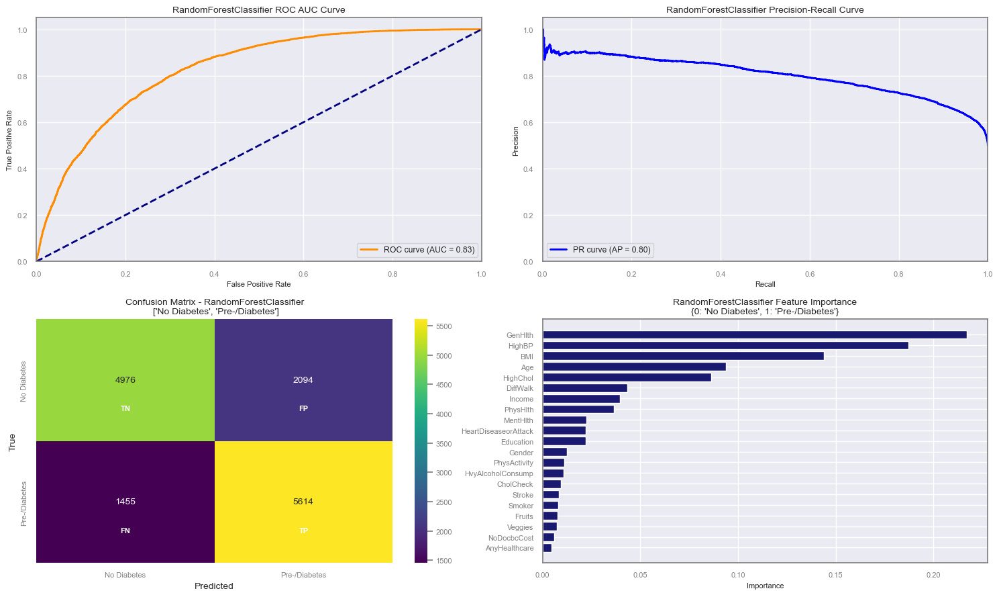

<Figure size 640x480 with 0 Axes>

In [70]:
best_params_df, cv_results_df, search = run_GridSearch_RandomizedSearch_CV(
    ensemble_model = rf,
    parameter_grid = param_dist,
    X              = X,
    X_train        = X_train_scaled,
    y_train        = y_train,
    X_test         = X_test_scaled,
    y_test         = y_test,
    CV_tuning_strategy = 0,
    is_classifier   = True,
    classification_dict = dict_outcome,
    iterations     = 10,
    n_jobs         = -1,
    verbose        = 2,
    n_repeats      = 10,
    cv_folds       = 5,
    random_state   = random_state
)

In [71]:
best_params_df

,n_estimators,min_samples_split,min_samples_leaf,max_features,max_depth,bootstrap,Model,Test_Param,Best_CV_Score,Test_Accuracy,execution_time,timestamp
0,50,5,1,sqrt,12,True,RandomForestClassifier,RandomizedSearchCV,0.750057,0.748992,00:00:27,2025-07-31 15:39:01


In [72]:
# cv_results_df

In [73]:
# show features and feature importances
feature_importances = pd.DataFrame({
    'Feature': X.columns,
    'Importance': search.best_estimator_.feature_importances_
}).sort_values(by='Importance', ascending=False)

# feature_importances

### GridSearchCV

Using HalvingGridSearchCV with halving factor 2...
n_iterations: 12
n_required_iterations: 12
n_possible_iterations: 12
min_resources_: 27
max_resources_: 56553
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 2160
n_resources: 27
Fitting 5 folds for each of 2160 candidates, totalling 10800 fits
[CV] END bootstrap=True, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=  

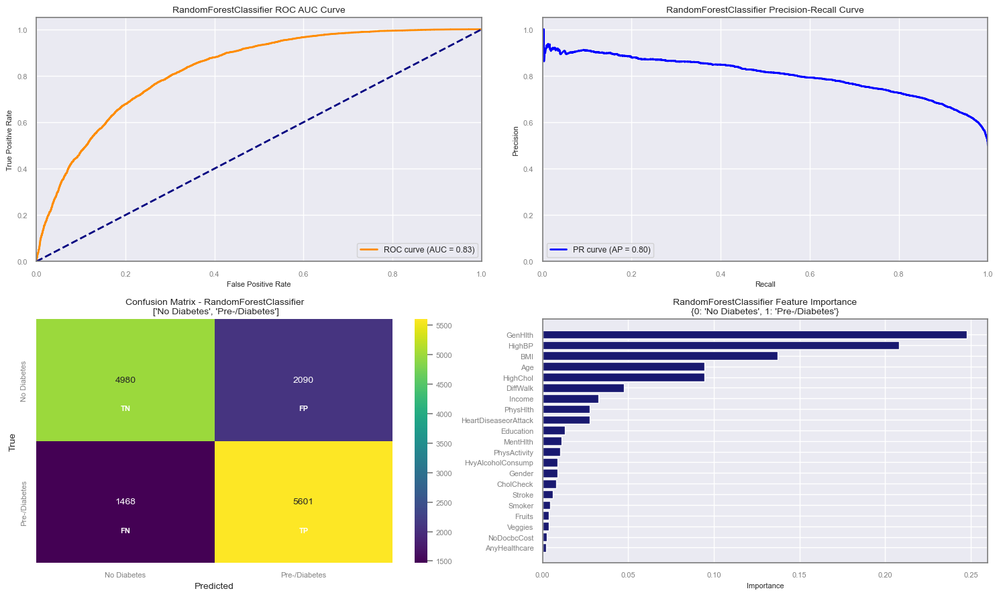

<Figure size 640x480 with 0 Axes>

In [74]:
best_params_df_grid, cv_results_df_grid, search_grid = run_GridSearch_RandomizedSearch_CV(
    ensemble_model = rf,
    parameter_grid = param_dist,
    X              = X,
    X_train        = X_train_scaled,
    y_train        = y_train,
    X_test         = X_test_scaled,
    y_test         = y_test,
    CV_tuning_strategy = 1,  # HalvingGridSearchCV
    is_classifier   = True,
    classification_dict = dict_outcome,
    iterations     = 10,
    n_jobs         = -1,
    verbose        = 2,
    n_repeats      = 10,
    cv_folds       = 5,
    random_state   = random_state,
    halving_factor = 2,  # Halving factor for HalvingGridSearchCV
    scoring_metric = 'accuracy'
)

In [75]:
best_params_df_grid

,bootstrap,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,Model,Test_Param,Best_CV_Score,Test_Accuracy,execution_time,timestamp
0,True,10,sqrt,4,10,200,RandomForestClassifier,HalvingGridSearchCV,0.750565,0.748356,00:04:23,2025-07-31 15:43:25


In [76]:
# cv_results_df_grid

##  <font color='plum'> 3.b. Hypertension Risk Prediction Dataset

Includes lifestyle, demographic, and clinical data (e.g., BMI, cholesterol, stress,
salt intake, smoking, family history) from individuals across multiple countries. It is
labeled for classification tasks (low vs. high risk of hypertension).
https://www.kaggle.com/datasets/ankushpanday1/hypertension-risk-prediction-dataset

### Load & Clean

In [77]:

file_path = "ankushpanday1/hypertension-risk-prediction-dataset"
file_name = "hypertension_dataset.csv"

df_3b = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)
df_3b.columns = df_3b.columns.str.strip() 
print(df_3b.shape)
df_3b.head()

(174982, 23)


,Country,Age,BMI,Cholesterol,Systolic_BP,Diastolic_BP,Smoking_Status,Alcohol_Intake,Physical_Activity_Level,Family_History,...,Sleep_Duration,Heart_Rate,LDL,HDL,Triglycerides,Glucose,Gender,Education_Level,Employment_Status,Hypertension
0,UK,58,29.5,230,160,79,Never,27.9,Low,Yes,...,6.1,80,100,75,72,179,Female,Primary,Unemployed,High
1,Spain,34,36.2,201,120,84,Never,27.5,High,Yes,...,9.8,56,77,47,90,113,Male,Secondary,Unemployed,High
2,Indonesia,73,18.2,173,156,60,Current,1.8,High,Yes,...,5.2,75,162,56,81,101,Male,Primary,Employed,Low
3,Canada,60,20.3,183,122,94,Never,11.6,Moderate,Yes,...,7.5,71,164,93,94,199,Female,Secondary,Retired,High
4,France,73,21.8,296,91,97,Never,29.1,Moderate,Yes,...,5.0,52,108,74,226,157,Female,Primary,Employed,High


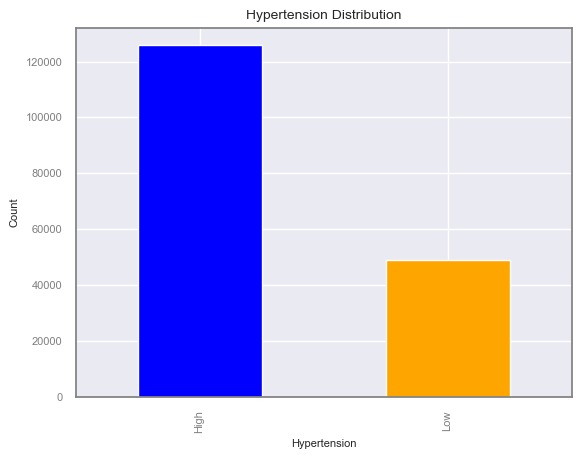

In [78]:
# pandas plot of 'Hypertension' column
df_3b['Hypertension'].value_counts().plot(kind='bar', title='Hypertension Distribution', xlabel='Hypertension', ylabel='Count', color=['blue', 'orange'])
plt.show()

<font color='plum'>

- This is an extremely imbalanced dataset, which isn't helping matters. The model will always favor the majority class to optimize accuracy at expense of minority class

- Will explore 'f1' or 'recall' in RandomizedSearchCV to force the model to optimize for minority class performance.


In [79]:
target_col          = 'Hypertension'
categorical_cols    = ['Country', 'Smoking_Status', 'Physical_Activity_Level', 'Family_History', 'Diabetes', 'Gender', 'Education_Level', 'Employment_Status', 'Hypertension']
numeric_cols        = ['Age', 'BMI', 'Cholesterol', 'Systolic_BP', 'Diastolic_BP', 'Alcohol_Intake', 'Stress_Level', 'Salt_Intake', 'Sleep_Duration', 'Heart_Rate', 'LDL', 'HDL', 'Triglycerides', 'Glucose']
len(categorical_cols), len(numeric_cols)

# for col in categorical_cols:
#     print(f'{col}: {df_3b[col].unique()},\n{df_3b[col].nunique()} unique values\n')

(9, 14)

In [80]:
data = df_3b.copy()

# Dropping 'Country' column because it's fucking pointless for this analysis 
data = data.drop(columns = ['Country'])

# One-hot encode 'Smoking_Status', and 'Employment_Status' columns
data = pd.get_dummies(data, columns = ['Smoking_Status', 'Employment_Status'], drop_first = True)

cat_cols_2 = ['Physical_Activity_Level', 'Family_History', 'Diabetes', 'Gender', 'Education_Level', 'Hypertension']

for col in cat_cols_2:
    data[col] = LabelEncoder().fit_transform(data[col])


data.head()

#export data to csv
# data.to_csv('hypertension_dataset_processed.csv', index=False)


,Age,BMI,Cholesterol,Systolic_BP,Diastolic_BP,Alcohol_Intake,Physical_Activity_Level,Family_History,Diabetes,Stress_Level,...,HDL,Triglycerides,Glucose,Gender,Education_Level,Hypertension,Smoking_Status_Former,Smoking_Status_Never,Employment_Status_Retired,Employment_Status_Unemployed
0,58,29.5,230,160,79,27.9,1,1,1,9,...,75,72,179,0,0,0,False,True,False,True
1,34,36.2,201,120,84,27.5,0,1,1,6,...,47,90,113,1,1,0,False,True,False,True
2,73,18.2,173,156,60,1.8,0,1,1,5,...,56,81,101,1,0,1,False,False,False,False
3,60,20.3,183,122,94,11.6,2,1,1,6,...,93,94,199,0,1,0,False,True,True,False
4,73,21.8,296,91,97,29.1,2,1,0,6,...,74,226,157,0,0,0,False,True,False,False


In [81]:
random_state        = 42
test_size           = 0.2

y = data[target_col]
X = data.drop(columns = [target_col])

### Random Forest Classifier - Hypertension

In [82]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, stratify = y, random_state = random_state)


# 2. Fit scaler on training data
scaler          = StandardScaler()
X_train_scaled  = scaler.fit_transform(X_train)
X_test_scaled   = scaler.transform(X_test)


# Apply SMOTE to handle class imbalance
smote = SMOTE(random_state = random_state, k_neighbors = 3)
X_train_scaled_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

model = RandomForestClassifier(random_state = random_state, class_weight = 'balanced')

# Use StratifiedKFold for cross-validation
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = random_state)

### RandomizedSearch CV - Hypertension

Using RandomizedSearchCV...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  19.1s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  19.2s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  19.3s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  21.0s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  22.1s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=  32.3s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_

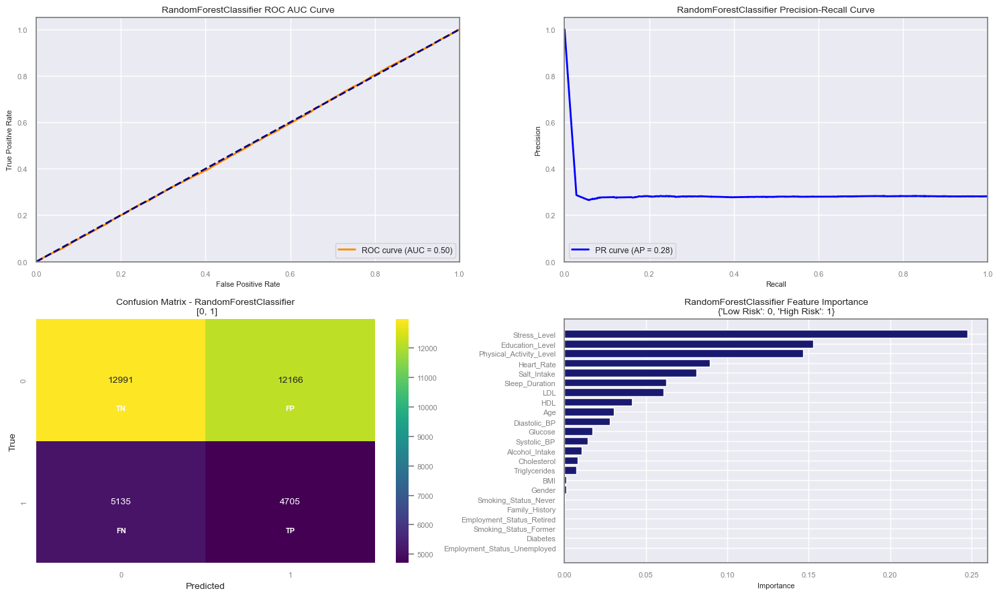

<Figure size 640x480 with 0 Axes>

In [83]:
## OPTIMIZING FOR RECALL ###
best_rf_model_3b1, cv_results_df_3b1, search_3b1 =  run_GridSearch_RandomizedSearch_CV(
    ensemble_model      = model,
    parameter_grid      = param_dist,
    X                   = X,
    X_train            = X_train_scaled_resampled,
    y_train            = y_train_resampled,
    X_test             = X_test_scaled,
    y_test             = y_test,
    scoring_metric     = 'recall',  # or 'f1'
    is_classifier      = True,
    CV_tuning_strategy = 0,
    classification_dict = {'Low Risk': 0, 'High Risk': 1},
    iterations         = 5,
    n_jobs             = -1,
    verbose            = 2,
    n_repeats          = 5,
    cv_folds           = 5,
    random_state       = random_state
)


Using RandomizedSearchCV...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  17.1s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  17.3s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  17.6s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  19.0s
[CV] END bootstrap=True, max_depth=12, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=50; total time=  19.6s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_estimators=300; total time=  29.4s
[CV] END bootstrap=False, max_depth=2, max_features=sqrt, min_samples_leaf=4, min_samples_split=2, n_

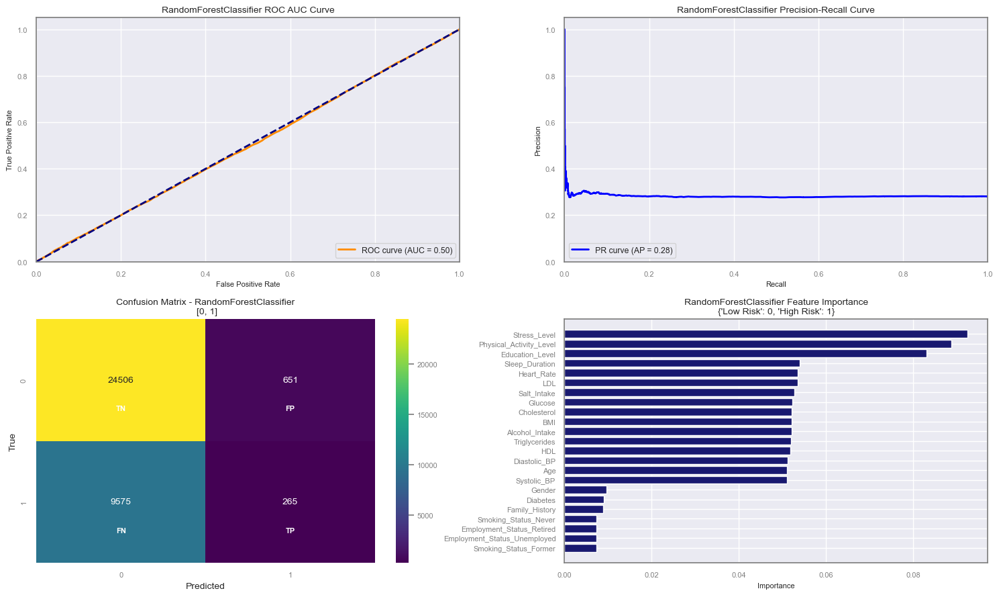

<Figure size 640x480 with 0 Axes>

In [84]:
## OPTIMIZING FOR F1 ###
best_rf_model_3b2, cv_results_df_3b2, search_3b2 = run_GridSearch_RandomizedSearch_CV(
    ensemble_model      = model,
    parameter_grid      = param_dist,
    X                   = X,
    X_train            = X_train_scaled_resampled,
    y_train            = y_train_resampled,
    X_test             = X_test_scaled,
    y_test             = y_test,
    scoring_metric     = 'f1',  # or 'f1'
    is_classifier      = True,
    CV_tuning_strategy = 0,  #  RandomizedSearchCV
    classification_dict = {'Low Risk': 0, 'High Risk': 1},
    iterations         = 5,
    n_jobs             = -1,
    verbose            = 2,
    n_repeats          = 5,
    cv_folds           = 5,
    random_state       = random_state
)

## <font color='plum'> 3.c. Chronic Kidney Disease Dataset

Contains comprehensive data for 1,659 patients, including 54 variables spanning medical history, lab results, medication usage, quality of life, and environmental
exposure. Ideal for regression, classification, and clustering analyses.
https://www.kaggle.com/datasets/rabieelkharoua/chronic-kidney-disease-dataset-analysis

### Load & Clean - CKD

In [85]:
file_path = "rabieelkharoua/chronic-kidney-disease-dataset-analysis"
file_name = "Chronic_Kidney_Dsease_data.csv"

# Load the latest version
df_3c = kagglehub.dataset_load(
  KaggleDatasetAdapter.PANDAS,
  file_path,
  file_name,
)

# df_3c.head()
df_3c.columns = df_3c.columns.str.strip()
columns_to_drop = ['PatientID', 'DoctorInCharge']  # Columns to drop
df_3c.drop(columns=columns_to_drop, inplace=True, errors='ignore')  # Drop specified columns
target_col          = 'Diagnosis'
categorical_cols    = []
numeric_cols        = []


X_df = df_3c.drop(columns = [target_col])
for col in X_df:
    if len(X_df[col].unique()) < 5:
        categorical_cols.append(col);
    else:
        numeric_cols.append(col);
    # print(f'{col}: {X_df[col].nunique()} unique values\n')

print(f"Categorical columns: {categorical_cols}")
print(f"Numeric columns: {numeric_cols}")
print(f'# Categorical cols: {len(categorical_cols)}, # Numeric cols: {len(numeric_cols)}')

categorical_cols_nominal = ['Ethnicity','SocioeconomicStatus', 'EducationLevel']



Categorical columns: ['Gender', 'Ethnicity', 'SocioeconomicStatus', 'EducationLevel', 'Smoking', 'FamilyHistoryKidneyDisease', 'FamilyHistoryHypertension', 'FamilyHistoryDiabetes', 'PreviousAcuteKidneyInjury', 'UrinaryTractInfections', 'ACEInhibitors', 'Diuretics', 'Statins', 'AntidiabeticMedications', 'Edema', 'HeavyMetalsExposure', 'OccupationalExposureChemicals', 'WaterQuality']
Numeric columns: ['Age', 'BMI', 'AlcoholConsumption', 'PhysicalActivity', 'DietQuality', 'SleepQuality', 'SystolicBP', 'DiastolicBP', 'FastingBloodSugar', 'HbA1c', 'SerumCreatinine', 'BUNLevels', 'GFR', 'ProteinInUrine', 'ACR', 'SerumElectrolytesSodium', 'SerumElectrolytesPotassium', 'SerumElectrolytesCalcium', 'SerumElectrolytesPhosphorus', 'HemoglobinLevels', 'CholesterolTotal', 'CholesterolLDL', 'CholesterolHDL', 'CholesterolTriglycerides', 'NSAIDsUse', 'FatigueLevels', 'NauseaVomiting', 'MuscleCramps', 'Itching', 'QualityOfLifeScore', 'MedicalCheckupsFrequency', 'MedicationAdherence', 'HealthLiteracy']
#

### Random Forest - CKD

In [86]:
## dictionary of column names of dataframe to store results for each ensemble method. ##

ensemble_df_columns = {
    # 'BaggingRegressor': ['Model', 'Test_Param','cv_repeats', '(R)MSE_found', 'test_(R)MSE', 'n_estimators', 'max_samples', 'max_features', 'bootstrap', 'execution_time', 'timestamp'],
    'RandomForestClassifier': ['Model', 'Test_Param', 'Best_CV_Accuracy', 'Test_Accuracy','n_estimators', 
           'max_features','max_depth','min_samples_split', 'min_samples_leaf', 
             'ccp_alpha', 'bootstrap', 'criterion', 'execution_time', 'timestamp'
           ]
    # 'GradientBoostingRegressor': ['Model', 'Test_Param','cv_repeats', '(R)MSE_found', 'test_(R)MSE', 'n_estimators', 'learning_rate', 'max_depth', 'max_features', 'bootstrap', 'execution_time', 'timestamp']
}

In [87]:
X = X_df
y = df_3c[target_col]

dict_outcome = {
    0: 'CKD_NO', 
    1: 'CKD_YES'
}

In [88]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = test_size, stratify = y, random_state = random_state)

# # Verify the shapes of the splits
# print(f"X_train shape: {X_train.shape}")
# print(f"X_test shape: {X_test.shape}")
# print(f"y_train shape: {y_train.shape}")
# print(f"y_test shape: {y_test.shape}")


# 2. Fit scaler on training data
scaler   = StandardScaler()
X_train  = scaler.fit_transform(X_train)
X_test   = scaler.transform(X_test)


# Apply SMOTE to handle class imbalance
smote               = SMOTE(random_state = random_state, k_neighbors = 3)
X_train, y_train    = smote.fit_resample(X_train, y_train)

model = RandomForestClassifier(random_state = random_state, class_weight = 'balanced')

# Use StratifiedKFold for cross-validation
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = random_state)

In [89]:

rf_cols                 = ensemble_df_columns['RandomForestClassifier']
# verbosity               = 2
param_dist = {
    'criterion':            ['gini','entropy'],  # use valid classifier criteria,
    'n_estimators': [50, 100, 150, 200, 300, 400],
    'max_depth': [None] + np.arange(2, 16, 2).tolist(),
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': [None, 'sqrt', 'log2'],
    'bootstrap': [True, False],
}

#### 3c. RandomizedSearchCV - CKD

Using RandomizedSearchCV...
Fitting 5 folds for each of 5 candidates, totalling 25 fits
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   4.7s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   4.8s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   4.9s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   4.8s
[CV] END bootstrap=True, criterion=gini, max_depth=10, max_features=None, min_samples_leaf=4, min_samples_split=10, n_estimators=150; total time=   4.9s
[CV] END bootstrap=True, criterion=gini, max_depth=4, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=300; total time=   

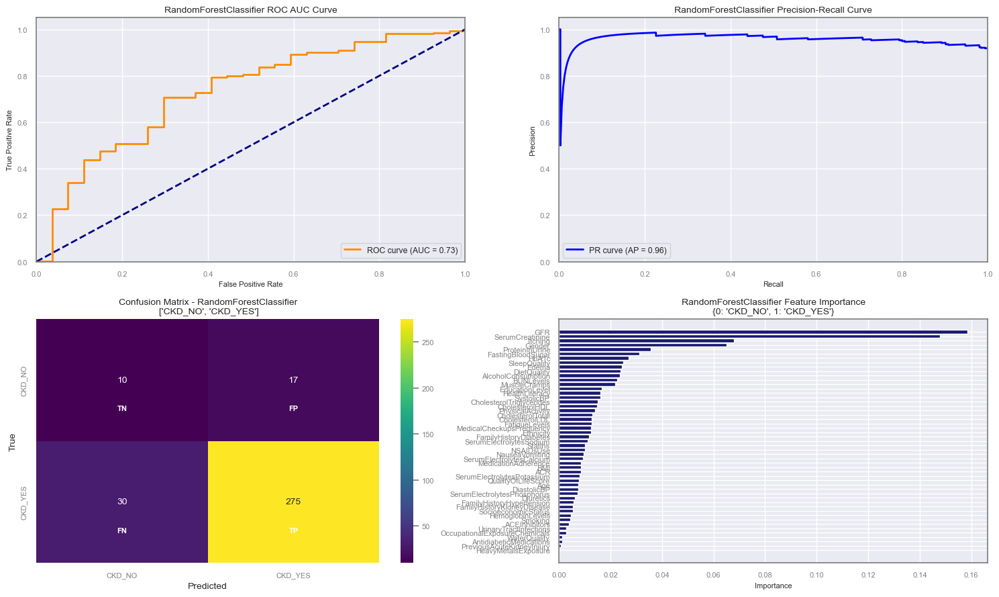

<Figure size 640x480 with 0 Axes>

In [90]:

results_RandomizedSearch_df_3c, cv_results_df_3c, search_3c = run_GridSearch_RandomizedSearch_CV(
    ensemble_model      = model,
    parameter_grid      = param_dist,
    X                  = X,
    CV_tuning_strategy = 0,  # RandomizedSearchCV
    is_classifier       = True,
    X_train             = X_train,
    y_train             = y_train,
    X_test              = X_test,
    y_test              = y_test,
    iterations          = 5,
    n_jobs              = -1,
    verbose             = 2,
    n_repeats           = 10,
    cv_folds            = 5,
    classification_dict = dict_outcome,
    random_state        = random_state
)

In [91]:
results_RandomizedSearch_df_3c

,n_estimators,min_samples_split,min_samples_leaf,max_features,max_depth,criterion,bootstrap,Model,Test_Param,Best_CV_Score,Test_Accuracy,execution_time,timestamp
0,150,10,4,None,10,gini,True,RandomForestClassifier,RandomizedSearchCV,0.939715,0.858434,00:00:26,2025-07-31 15:57:04


In [92]:
cv_results_df_3c

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_n_estimators,param_min_samples_split,param_min_samples_leaf,param_max_features,param_max_depth,param_criterion,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,4.796215,0.079275,0.007215,0.002005,150,10,4,None,10,gini,...,0.939715,0.015875,1,0.986154,0.988205,0.991795,0.987699,0.991799,0.989130,0.002280
1,17.182215,0.328156,0.009400,0.002967,300,5,4,None,14,gini,...,0.890076,0.013429,3,0.966667,0.976410,0.981026,0.974372,0.970784,0.973852,0.004885
2,5.691747,0.108768,0.005749,0.002358,150,10,1,None,6,gini,...,0.845775,0.008646,4,0.907179,0.900000,0.917436,0.916453,0.908765,0.909967,0.006425
3,0.699939,0.011213,0.009978,0.002985,300,10,2,log2,4,gini,...,0.916751,0.025278,2,0.952821,0.943077,0.953333,0.950794,0.944644,0.948934,0.004258
4,11.934652,0.212507,0.006939,0.001944,300,10,4,None,6,entropy,...,0.820756,0.011635,5,0.890256,0.895897,0.903077,0.855459,0.876986,0.884335,0.016780


In [93]:
search_3c

RandomizedSearchCV(cv=5,
                   estimator=RandomForestClassifier(class_weight='balanced',
                                                    random_state=42),
                   n_iter=5, n_jobs=-1,
                   param_distributions={'bootstrap': [True, False],
                                        'criterion': ['gini', 'entropy'],
                                        'max_depth': [None, 2, 4, 6, 8, 10, 12,
                                                      14],
                                        'max_features': [None, 'sqrt', 'log2'],
                                        'min_samples_leaf': [1, 2, 4],
                                        'min_samples_split': [2, 5, 10],
                                        'n_estimators': [50, 100, 150, 200, 300,
                                                         400]},
                   random_state=42, return_train_score=True, scoring='accuracy',
                   verbose=2)

#### 3c. GridSearchCV - CKD

Using HalvingGridSearchCV with halving factor 2...
n_iterations: 7
n_required_iterations: 13
n_possible_iterations: 7
min_resources_: 20
max_resources_: 2438
aggressive_elimination: False
factor: 2
----------
iter: 0
n_candidates: 5184
n_resources: 20
Fitting 5 folds for each of 5184 candidates, totalling 25920 fits
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=None, min_samples_leaf=1, min_samples_split=2, n_estimators=50; total time=   0.0s
[CV] END bootstrap=True, criterion=gini, max_depth=None, max_features=

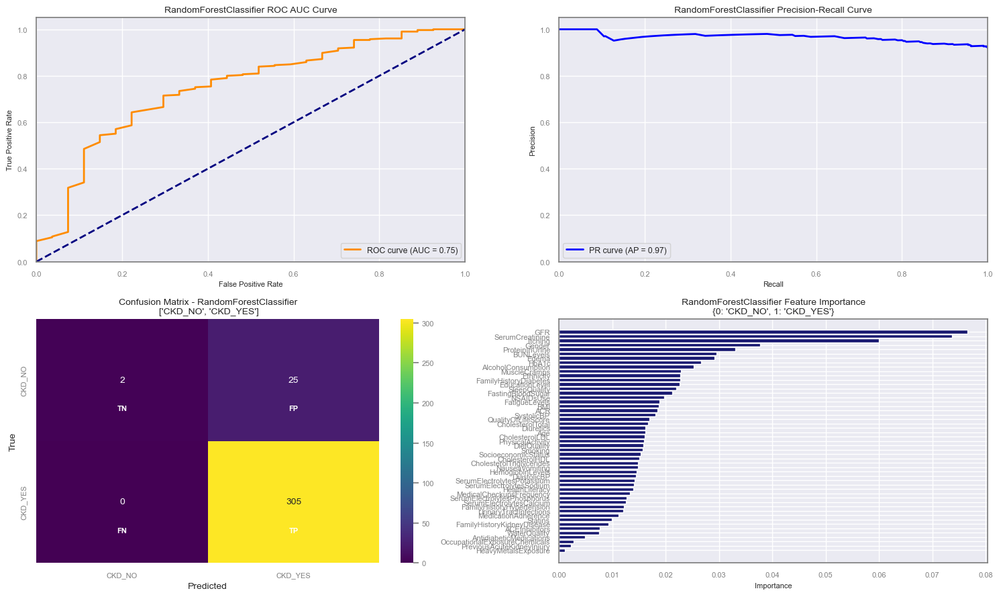

<Figure size 640x480 with 0 Axes>

In [94]:
# run the fucking grid search
results_GridSearch_df_3c, cv_results_df_3c_grid, search_3c_grid = run_GridSearch_RandomizedSearch_CV(
    ensemble_model      = model,
    parameter_grid      = param_dist,
    X                  = X,
    CV_tuning_strategy = 1,  # HalvingGridSearchCV
    is_classifier       = True,
    X_train             = X_train,
    y_train             = y_train,
    X_test              = X_test,
    y_test              = y_test,
    iterations          = 5,
    n_jobs              = -1,
    verbose             = 2,
    n_repeats           = 10,
    cv_folds            = 5,
    classification_dict = dict_outcome,
    random_state        = random_state
)


In [95]:
results_GridSearch_df_3c

,bootstrap,criterion,max_depth,max_features,min_samples_leaf,min_samples_split,n_estimators,Model,Test_Param,Best_CV_Score,Test_Accuracy,execution_time,timestamp
0,False,gini,None,log2,1,2,300,RandomForestClassifier,HalvingGridSearchCV,0.979675,0.924699,02:27:08,2025-07-31 18:24:14


In [98]:
cv_results_df_3c_grid,

(       iter  n_resources  mean_fit_time  std_fit_time  mean_score_time  \
 0         0           20       0.020386      0.000271         0.001004   
 1         0           20       0.049184      0.005748         0.001959   
 2         0           20       0.085624      0.010908         0.002784   
 3         0           20       0.117798      0.006792         0.004528   
 4         0           20       0.190643      0.016048         0.005112   
 ...     ...          ...            ...           ...              ...   
 10282     6         1280      10.782218      0.032777         0.008714   
 10283     6         1280       2.809207      4.031254         0.006400   
 10284     6         1280       0.724602      0.026872         0.010191   
 10285     6         1280       0.447501      0.021114         0.003004   
 10286     6         1280       0.586587      0.016058         0.005214   
 
        std_score_time param_bootstrap param_criterion param_max_depth  \
 0            0.000102  

In [97]:
search_3c_grid 

HalvingGridSearchCV(estimator=RandomForestClassifier(class_weight='balanced',
                                                     random_state=42),
                    factor=2, n_jobs=-1,
                    param_grid={'bootstrap': [True, False],
                                'criterion': ['gini', 'entropy'],
                                'max_depth': [None, 2, 4, 6, 8, 10, 12, 14],
                                'max_features': [None, 'sqrt', 'log2'],
                                'min_samples_leaf': [1, 2, 4],
                                'min_samples_split': [2, 5, 10],
                                'n_estimators': [50, 100, 150, 200, 300, 400]},
                    random_state=42, scoring='accuracy', verbose=2)

# 4. Storytelling With Data plot

Reproduce any graph of your choice in chapter seven (p. 165-185) of the Storytelling With Data book as best you can. You do not have to get the exact data values right, just the overall look and feel.

<font color = 'plum'> from page 154, Figure 6.2  of *Storytelling with Data* 

<Figure size 1000x500 with 0 Axes>

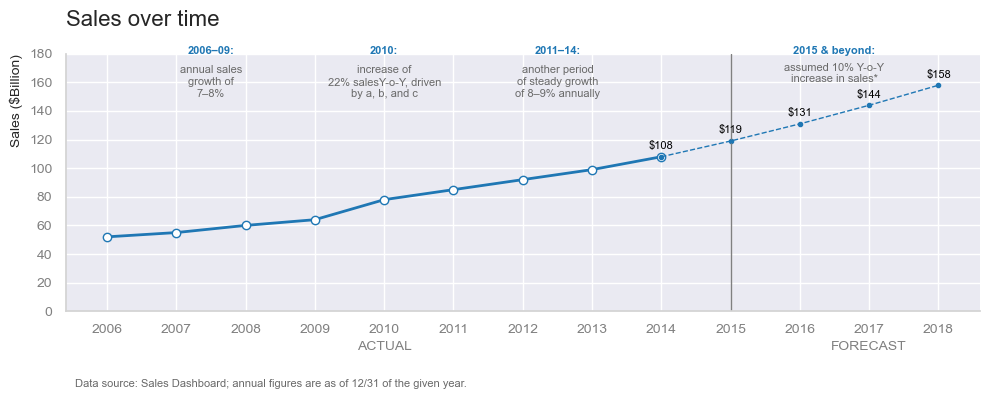

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# Data from the chart
years_actual = [2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014]
sales_actual = [52, 55, 60, 64, 78, 85, 92, 99, 108] # Approximated from the chart

years_forecast = [2014, 2015, 2016, 2017, 2018]
sales_forecast = [108, 119, 131, 144, 158] # 2014 included to connect actual and forecast

plt.figure(figsize=(10, 5))
fig, ax = plt.subplots(figsize=(10, 4))

#  actual sales
ax.plot(years_actual, sales_actual, marker='o', linestyle='-', color='tab:blue', linewidth=2, markersize=6, markerfacecolor='white', markeredgecolor='tab:blue')

# Plot forecast sales
ax.plot(years_forecast, sales_forecast, marker='o', linestyle='--', color='tab:blue', linewidth=1, markersize=3)

# Add specific markers for the forecast points (if not already covered by the line plot)
forecast_years_points = [2015, 2016, 2017, 2018]
forecast_sales_points = [119, 131, 144, 158]
ax.scatter(forecast_years_points, forecast_sales_points, marker='o', color='tab:blue', s=3, zorder=5) # zorder to ensure markers are on top

# Add sales values on top of the markers for 2014-2018
for i, year in enumerate(years_forecast):
    if year >= 2014: # Only for 2014 and beyond
        ax.text(year, sales_forecast[i] + 4, f'${sales_forecast[i]}', ha='center', va='bottom', fontsize=8, color='black') # Fontsize set to 8

# Set title and labels
ax.set_title('Sales over time', loc='left', fontsize=16, pad=20)
ax.set_xlabel('') # We'll add custom labels for 'ACTUAL' and 'FORECAST'
ax.set_ylabel('Sales ($Billion)', loc = 'top',fontsize=10)

# Set y-axis limits and ticks
ax.set_ylim(0, 180)
ax.set_yticks(np.arange(0, 181, 20))
ax.tick_params(axis='y', labelsize=10)

# Shift x-axis labels to be between the x-axis ticks
# Create new tick locations and labels
ax.set_xticks(np.arange(2006, 2019, 1))
ax.set_xticklabels([str(int(year)) for year in np.arange(2006, 2019, 1)])
ax.tick_params(axis='x', labelsize=10)

# Add annotations for periods
# Adjust y coordinates based on exact visual placement
ax.text(2007.5, 180, '2006–09:', ha='center', fontsize=8, color='tab:blue', weight='bold') 
ax.text(2007.5, 150, 'annual sales\ngrowth of\n7–8%', ha='center', fontsize=8, color='dimgray') 

ax.text(2010.0, 180, '2010:', ha='center', fontsize=8, color='tab:blue', weight='bold') 
ax.text(2010.0, 150, 'increase of\n22% salesY-o-Y, driven\nby a, b, and c', ha='center', fontsize=8, color='dimgray') 

ax.text(2012.5, 180, '2011–14:', ha='center', fontsize=8, color='tab:blue', weight='bold') # Fo
ax.text(2012.5, 150, 'another period\nof steady growth\nof 8–9% annually', ha='center', fontsize=8, color='dimgray') 

ax.text(2016.5, 180, '2015 & beyond:', ha='center', fontsize=8, color='tab:blue', weight='bold') 
ax.text(2016.5, 160, 'assumed 10% Y-o-Y\nincrease in sales*', ha='center', fontsize=8, color='dimgray') 

# Add 'ACTUAL' and 'FORECAST' text and dividing line
# Adjusted x-coordinates for alignment with shifted ticks
ax.text(2010, -25, 'ACTUAL',    ha='center', va='center', fontsize=10, color='gray')
ax.text(2017, -25, 'FORECAST',  ha='center', va='center', fontsize=10, color='gray')
ax.axvline(x=2015, color='gray', linestyle='-', linewidth=1) # Vertical line remains at 2014.5

# Add rectangular patches for ACTUAL and FORECAST background
# Coordinates for the rectangles: [x, y], width, height
# Actual background
rect_actual = plt.Rectangle((2005.5, -30), 9, 25, facecolor='lightgray', alpha=0.3, zorder=0, transform=ax.transData)
ax.add_patch(rect_actual)

# Forecast background
rect_forecast = plt.Rectangle((2014.5, -30), 4, 25, facecolor='lightgray', alpha=0.3, zorder=0, transform=ax.transData)
ax.add_patch(rect_forecast)

#  footers
fig.text(0.08, 0.02, 'Data source: Sales Dashboard; annual figures are as of 12/31 of the given year.',
         ha='left', fontsize=8, color='dimgray') # Fontsize set to 8

# Remove the top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['left'].set_color('lightgray')
ax.spines['bottom'].set_color('lightgray')
ax.tick_params(axis='x', colors='gray')
ax.tick_params(axis='y', colors='gray')

# Remove gridlines
# plt.grid(axis='y', linestyle='-', alpha=0.7, color='lightgray') # Commented out to remove gridlines
ax.set_axisbelow(True) # Ensure grid is behind the plot lines, even if no gridlines are shown for consistency

plt.tight_layout(rect=[0, 0.05, 1, 1]) # Adjust layout to make space for footers
plt.show()

### Old code

In [ ]:
# start  = time.time()
# Randomized Search
# param_dist = {
#     'n_estimators': randint(50, 300),
#     'max_depth': [None] + list(range(5, 30, 5)),
#     'min_samples_split': randint(2, 10),
#     'min_samples_leaf': randint(1, 10)
# }

# random_search = RandomizedSearchCV(estimator = rf, 
#                                    param_distributions = param_dist, 
#                                    n_iter   = 10, 
#                                    cv       = cv, 
#                                    scoring  = scorer, 
#                                    random_state = random_state, 
#                                    n_jobs   = -1)
# random_search.fit(X_train, y_train)

# end             = time.time()
# execution_time  = format_hms(end - start)

# print("RandomizedSearchCV\n")
# # print(f"Best Estimator: {random_search.best_estimator_}")
# print(f"Best Parameters: {random_search.best_params_}")
# print(f"Best ROC AUC Score (CV): {random_search.best_score_:,.4f}")
# print(f"Test ROC AUC Score: {roc_auc_score(y_test, random_search.predict_proba(X_test)[:, 1]):,.4f}")
# print(f"Execution time for RandomizedSearchCV: {execution_time}\n")

In [ ]:
# start  = time.time()
# # Randomized Search
# param_dist = {
#     'n_estimators': randint(50, 300),
#     'max_depth': [None] + list(range(5, 30, 5)),
#     'min_samples_split': randint(2, 10),
#     'min_samples_leaf': randint(1, 10)
# }

# random_search = RandomizedSearchCV(estimator = rf, 
#                                    param_distributions = param_dist, 
#                                    n_iter = 10, 
#                                    cv = cv, 
#                                    scoring = scorer, 
#                                    random_state = random_state, 
#                                    n_jobs = -1)
# random_search.fit(X_train, y_train)

# end             = time.time()
# execution_time  = format_hms(end - start)

# print("RandomizedSearchCV\n")
# # print(f"Best Estimator: {random_search.best_estimator_}")
# print(f"Best Parameters: {random_search.best_params_}")
# print(f"Best ROC AUC Score (CV): {random_search.best_score_:,.4f}")
# print(f"Test ROC AUC Score: {roc_auc_score(y_test, random_search.predict_proba(X_test)[:, 1]):,.4f}")
# print(f"Execution time for RandomizedSearchCV: {execution_time}\n")

<!-- #### 3c.1. n_estimators -->

In [ ]:
# # Initial parameters for RandomForestClassifier
# initial_parameters = {
#     'n_estimators':         100,  # Will be updated by the sweep
#     'criterion':            'gini',
#     'max_features':         None,
#     'max_depth':            None,
#     'min_samples_split':    2,
#     'min_samples_leaf':     1,
#     'bootstrap':            True,
#     'random_state':         random_state,
# }
# # random_state = 42

In [ ]:

# # Run the parameter sweep for n_estimators
# best_params_RFC_estimators = sweep_parameter(
#     model               = classification_model,
#     Parameters          = initial_parameters,
#     param               = 'n_estimators',
#     parameter_list      = list(np.arange(200,270,10)),
#     X_train             = X_train,
#     y_train             = y_train,
#     X_test              = X_test,
#     y_test              = y_test,
#     verbose             = True,
#     show_rmse           = False,
#     show_accuracy       = True,
#     n_jobs              = -1,
#     n_repeats           = 10, # changed from the default 10 to 5 to reduce execution time
#     cv_folds            = 5, # changed from the default 5 to 3 to reduce execution time,
#     classification_dict = dict_outcome
# )

In [ ]:
# best_params_RFC_estimators

<!-- #### 3c.2. max_features -->

In [ ]:
# # Initial parameters for RandomForestClassifier
# initial_parameters = {
#     'n_estimators':         best_params_RFC_estimators['n_estimators'],  # Will be updated by the sweep
#     'criterion':            'gini',
#     'max_features':         'sqrt',
#     'max_depth':            None,
#     'min_samples_split':    2,
#     'min_samples_leaf':     1,
#     'random_state':         random_state,
# }

In [ ]:
# best_params_RFC_max_features = sweep_parameter(
#     model               = classification_model,
#     Parameters          = initial_parameters,
#     param               = 'max_features',
#     parameter_list      = list(np.arange(19,40,1)),
#     X_train             = X_train,
#     y_train             = y_train,
#     X_test              = X_test,
#     y_test              = y_test,
#     verbose             = True,
#     show_rmse           = False,
#     show_accuracy       = True,
#     n_jobs              = -1,
#     n_repeats           = 10, # change from the default 10 to 5 to reduce execution time
#     cv_folds            = 5, # change from the default 5 to 3 to reduce execution time
#     classification_dict = dict_outcome
# )

In [ ]:
# best_params_RFC_max_features

<!-- #### 3c.3 max_depth -->

In [ ]:
# initial_parameters = {
#     'n_estimators':         best_params_RFC_estimators['n_estimators'],  # Will be updated by the sweep
#     'criterion':            'gini',
#     'max_features':         best_params_RFC_max_features['max_features'],  # Will be updated by the sweep
#     'max_depth':            None,
#     'min_samples_split':    2,
#     'min_samples_leaf':     1,
#     'random_state':         random_state,
# }

In [ ]:

# best_params_RFC_max_depth = sweep_parameter(
#     model           = classification_model,
#     Parameters      = initial_parameters,
#     param           = 'max_depth',
#     parameter_list  = list(np.arange(10,16)),
#     X_train         = X_train,
#     y_train         = y_train,
#     X_test          = X_test,
#     y_test          = y_test,
#     verbose         = True,
#     show_rmse       = False,
#     show_accuracy   = True,
#     n_jobs          = -1,
#     n_repeats       = 10, # changed from the default 10 to 5 to reduce execution time
#     cv_folds        = 5, # changed from the default 5 to 3 to reduce execution time
#     classification_dict = dict_outcome
# )

In [ ]:
# best_params_RFC_max_depth

<!-- #### 3c.4 min_samples_split -->

In [ ]:
# initial_parameters = {
#     'n_estimators':         best_params_RFC_estimators['n_estimators'],  
#     'criterion':            'gini',
#     'max_features':         best_params_RFC_max_features['max_features'],  
#     'max_depth':            best_params_RFC_max_depth['max_depth'],  
#     'min_samples_split':    2,
#     'min_samples_leaf':     1,
#     'random_state':         random_state,
# }

In [ ]:
# best_params_RFC_min_samples_split = sweep_parameter(
#     model           = RandomForestClassifier,
#     Parameters      = initial_parameters,
#     param           = 'min_samples_split',
#     parameter_list  = get_parameter_list('min_samples_split', list(np.arange(2, 11))),
#     X_train         = X_train,
#     y_train         = y_train,
#     X_test          = X_test,
#     y_test          = y_test,
#     verbose         = True,
#     show_rmse       = False,
#     show_accuracy   = True,
#     n_jobs          = -1,
#     n_repeats       = 10, # changed from the default 10 to 5 to reduce execution time
#     cv_folds        = 5, # changed from the default 5 to 3 to reduce execution time,
#     classification_dict= dict_outcome
# )

In [ ]:
# best_params_RFC_min_samples_split

<!-- #### 3c.5 min_samples_leaf -->

In [ ]:
# initial_parameters = {
#     'n_estimators':         best_params_RFC_estimators['n_estimators'],  
#     'criterion':            'gini',
#     'max_features':         best_params_RFC_max_features['max_features'],  
#     'max_depth':            best_params_RFC_max_depth['max_depth'],  
#     'min_samples_split':    best_params_RFC_min_samples_split['min_samples_split'],
#     'min_samples_leaf':     1,
#     'random_state':         random_state,
# }

In [ ]:
# best_params_RFC_min_samples_leaf = sweep_parameter(
#     model           = classification_model,
#     Parameters      = initial_parameters,
#     param           = 'min_samples_leaf',
#     parameter_list  = list(np.arange(1, 11)),
#     X_train         = X_train,
#     y_train         = y_train,
#     X_test          = X_test,
#     y_test          = y_test,
#     verbose         = True,
#     show_rmse       = False,
#     show_accuracy   = True,
#     n_jobs          = -1,
#     n_repeats       = 10, # changed from the default 10 to 5 to reduce execution time
#     cv_folds        = 5, # changed from the default 5 to 3 to reduce execution time,
#     classification_dict= dict_outcome
# )

In [ ]:
# best_params_RFC_min_samples_leaf

<!-- #### 3c.6 Sweep Summary -->

In [ ]:
# rf_classification_sweep_results_df = pd.DataFrame(
#     [best_params_RFC_estimators, 
#      best_params_RFC_max_features, 
#      best_params_RFC_max_depth, 
#      best_params_RFC_min_samples_split, 
#      best_params_RFC_min_samples_leaf, 
#    #   best_params_RFC_ccp_alpha,
#    #      best_params_RFC_bootstrap,
#    #      best_params_RFC_criterion
#      ])

# rf_classification_sweep_results_df = reorder_columns(rf_classification_sweep_results_df, rf_cols)

# # Print the reordered DataFrame
# rf_classification_sweep_results_df